# Decision Trees and Random Forests

-  This project utilises Decision Trees and Random Forests algorithms to create a predictive model for **LendingClub** to determine the probability of a borrower having a high chance of paying the loan in full.
- The Dataset is from 2007-2010.

## Dataset from LendingClub
The dataset contains the following:
- **credit.policy**: 1 when customer meets the credit underwriting criteria and 0 if otherwise.
- **purpose**: Purpose for borrowing the loan 
- **int.rate**: Interest rate of the loan
- **installment**: The monthly installments attached to the loan
- **log.annual.inc**: The natural log of self-reported annual income of borrower.
- **dti**: The debt-to-income ratio of the borrower (amount of debt divided by annual income).
- **fico**: The FICO credit score of the borrower.
- **days.with.cr.line**: The number of days the borrower has had a credit line.
- **revol.bal**: Borrower's revolving balance (amount unpaid at the end of the credit card billing cycle).
- **revol.util**: Borrower's revolving line utilization rate (the amount of the credit line used relative to total credit available).
- **inq.last.6mths**: Borrower's number of inquiries by creditors in the last 6 months.
- **delinq.2yrs**: Number of times the borrower had been 30+ days past due on a payment in the past 2 years.
- **pub.rec**: Borrower's number of derogatory public records (bankruptcy filings, tax liens, or judgments).

## Environmental Setup

In [1]:
import pandas as pd
import numpy as np

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Load Dataset

In [3]:
loans = pd.read_csv('loan_data.csv')

In [4]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
credit.policy        9578 non-null int64
purpose              9578 non-null object
int.rate             9578 non-null float64
installment          9578 non-null float64
log.annual.inc       9578 non-null float64
dti                  9578 non-null float64
fico                 9578 non-null int64
days.with.cr.line    9578 non-null float64
revol.bal            9578 non-null int64
revol.util           9578 non-null float64
inq.last.6mths       9578 non-null int64
delinq.2yrs          9578 non-null int64
pub.rec              9578 non-null int64
not.fully.paid       9578 non-null int64
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


In [5]:
loans.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9.578000e+03,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122640,319.089413,10.932117,12.606679,710.846314,4560.767197,1.691396e+04,46.799236,1.577469,0.163708,0.062122,0.160054
std,0.396245,0.026847,207.071301,0.614813,6.883970,37.970537,2496.930377,3.375619e+04,29.014417,2.200245,0.546215,0.262126,0.366676
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.558414,7.212500,682.000000,2820.000000,3.187000e+03,22.600000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.665000,707.000000,4139.958333,8.596000e+03,46.300000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.140700,432.762500,11.291293,17.950000,737.000000,5730.000000,1.824950e+04,70.900000,2.000000,0.000000,0.000000,0.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


- Provides statistical descriptions of the dataset

In [6]:
loans.head(2)

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0


# Exploratory Data Analysis (EDA)

- Create a histogram of two FICO distributions, each showing the two credit.policy outcome

Text(0.5, 0, 'FICO')

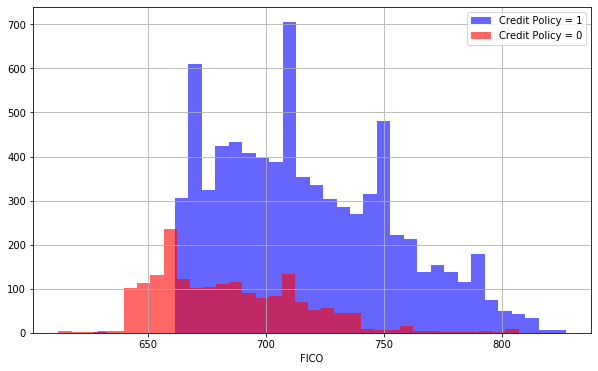

In [7]:
plt.figure(figsize=(10,6))

loans[loans['credit.policy']==1]['fico'].hist(bins=35,color='blue',label='Credit Policy = 1',
                                             alpha=0.6)
loans[loans['credit.policy']==0]['fico'].hist(bins=35,color='red',label='Credit Policy = 0',
                                             alpha=0.6)
plt.legend()
plt.xlabel('FICO')

- Interestingly, there are a lot more peopple with credit policy 1 (high credit rating) than those with credit policy 0 (low credit rating). 
- From the graphs, it appears like **660** is the cut-off-point. Those with a **FICO score** less than 660 will automatically be disqualified.

 - Next I will further explore the data by evaluating the **not.fully paid column**

Text(0.5, 0, 'FICO')

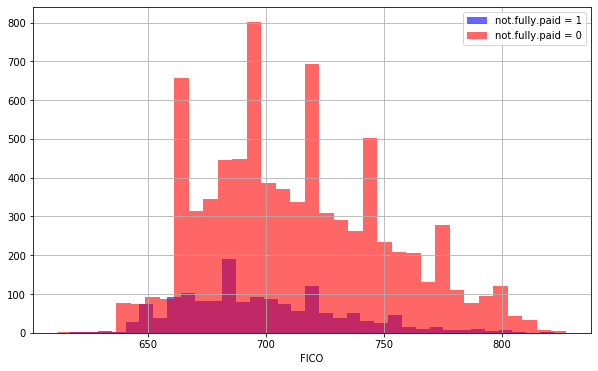

In [8]:
plt.figure(figsize=(10,6))

loans[loans['not.fully.paid']==1]['fico'].hist(bins=35,color='blue',label='not.fully.paid = 1',
                                             alpha=0.6)
loans[loans['not.fully.paid']==0]['fico'].hist(bins=35,color='red',label='not.fully.paid = 0',
                                             alpha=0.6)
plt.legend()
plt.xlabel('FICO')

- From the graphs, it is also observed that a lot of people have 0 **not fully paid** which implies that many people where fully paying.
- And there isn't a sharp cutt off between the not fully paid (0) and (1) as there was in the previous histogram. So there is a form of overlap between the two category.

- **Next, I create a countplot using seaborn to explore more the loan datasets using the purpose column**

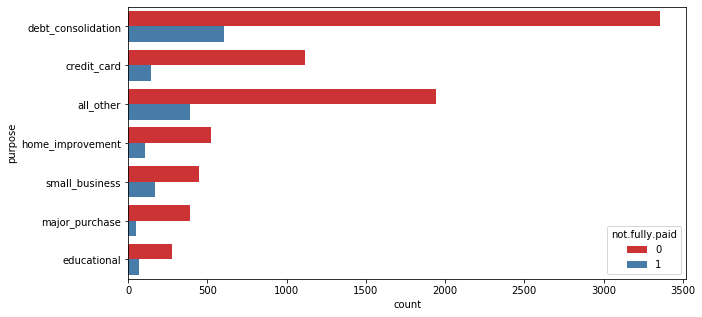

In [9]:
plt.figure(figsize=(10,5))
sns.countplot(y="purpose", hue="not.fully.paid", data=loans, palette='Set1')

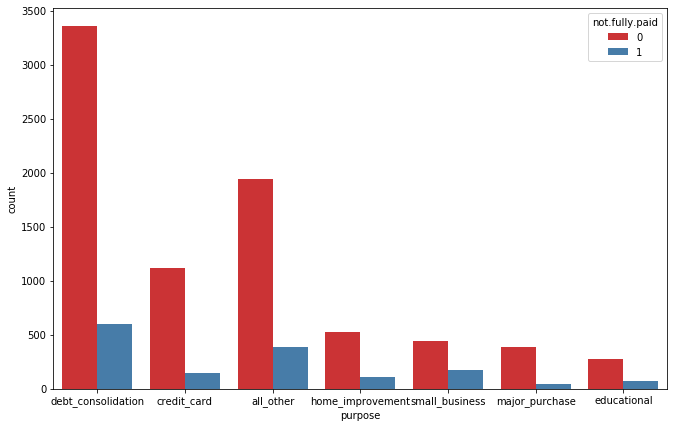

In [10]:
plt.figure(figsize=(11,7))
sns.countplot(x="purpose", hue="not.fully.paid", data=loans, palette='Set1')

## Resulting Interpretations
- It is clear from the plot above that **debt_consolidation** is the most common reason people borrowed loan
- **Credit_card and all_other** were the second most common reason 
- Notice also that the ratio between the **nit fully paid** and **fully paid** seems to be pretty similar for all the reasons.

## Relationship Between FICO Score and Interest Rate

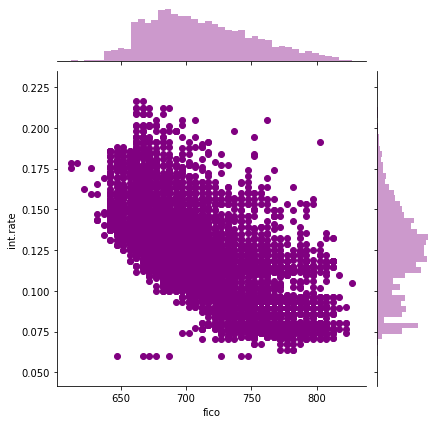

In [11]:
sns.jointplot(x="fico", y="int.rate", data=loans,color='purple')

- Interestingly, from the above graph the **interest rate** decreases with increasing **fico score**
- fico score indicates a better credit score

## Linear Regression Model
- Next, I will use the linear regression model algorithm to determine the trend between the **not fully paid** and **credit.policy**

<Figure size 792x504 with 0 Axes>

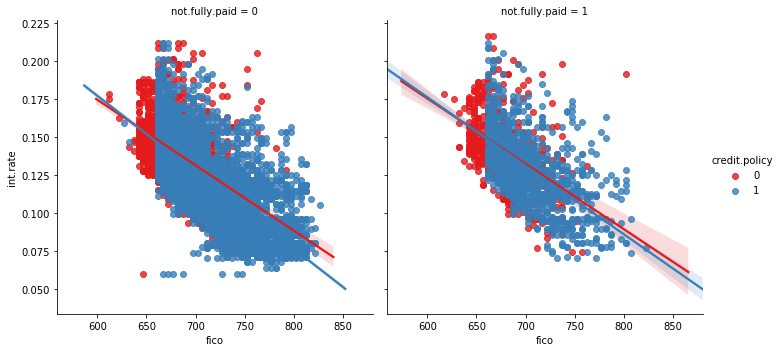

In [12]:
plt.figure(figsize=(11,7))

sns.lmplot(x="fico", y="int.rate", data=loans,hue='credit.policy',col='not.fully.paid',palette='Set1')

- The plots showing the **not fully paid** and **credit policy**
- And from the plots, it can be observed that the behaviour is relatively the same, whether not it was fully paid or they were denied the credit policy.

# Decision Trees and Random Forest 

In [13]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
credit.policy        9578 non-null int64
purpose              9578 non-null object
int.rate             9578 non-null float64
installment          9578 non-null float64
log.annual.inc       9578 non-null float64
dti                  9578 non-null float64
fico                 9578 non-null int64
days.with.cr.line    9578 non-null float64
revol.bal            9578 non-null int64
revol.util           9578 non-null float64
inq.last.6mths       9578 non-null int64
delinq.2yrs          9578 non-null int64
pub.rec              9578 non-null int64
not.fully.paid       9578 non-null int64
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


# Dealing with Categorical Data

- Notice that the **purpose** column is a categorical value. 
- There I will need to transform the **categorical value** using **dummy variables** 
- But First, I will creat a list of the categorical features called **cat_feats**
- Use **pd.get_dummies(loans, columns=cat_feats, drop_first=True)** to create a dataframe containing the new feature column created with dummy variables. 
- Set the dataframe as **final_data**

In [14]:
cat_feats = ['purpose']

In [15]:
final_data = pd.get_dummies(loans,columns=cat_feats,drop_first=True)

In [16]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 19 columns):
credit.policy                 9578 non-null int64
int.rate                      9578 non-null float64
installment                   9578 non-null float64
log.annual.inc                9578 non-null float64
dti                           9578 non-null float64
fico                          9578 non-null int64
days.with.cr.line             9578 non-null float64
revol.bal                     9578 non-null int64
revol.util                    9578 non-null float64
inq.last.6mths                9578 non-null int64
delinq.2yrs                   9578 non-null int64
pub.rec                       9578 non-null int64
not.fully.paid                9578 non-null int64
purpose_credit_card           9578 non-null uint8
purpose_debt_consolidation    9578 non-null uint8
purpose_educational           9578 non-null uint8
purpose_home_improvement      9578 non-null uint8
purpose_major_purchase        9

- Notice that the **purpose** column have been converted to 0 and 1, which is what I want

In [18]:
final_data.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,0,1,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0,1,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,0,1,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,0,1,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0,1,0,0,0,0,0


# Train_Test_Split

In [19]:
from sklearn.model_selection import train_test_split

In [20]:
X = final_data.drop('not.fully.paid', axis=1)
y = final_data['not.fully.paid']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

# Decision Tree Model

In [21]:
from sklearn.tree import DecisionTreeClassifier

In [22]:
dtree = DecisionTreeClassifier()

In [23]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

# Model Predictions and Evaluation 

- Next I will create a prediction model from the test dataset
- Use **confusion matrix** and **classification report** to evaluate my model performance 

In [24]:
predictions = dtree.predict(X_test)

In [25]:
from sklearn.metrics import classification_report, confusion_matrix

In [26]:
print(confusion_matrix(y_test,predictions))
print('\n')
print(classification_report(y_test,predictions))

[[2001  430]
 [ 340  103]]


              precision    recall  f1-score   support

           0       0.85      0.82      0.84      2431
           1       0.19      0.23      0.21       443

    accuracy                           0.73      2874
   macro avg       0.52      0.53      0.52      2874
weighted avg       0.75      0.73      0.74      2874



# Tree Visualisation

In [30]:
#from IPython.display import Image
#from sklearn.externals.six import StringIO
#from sklearn.tree import export_graphviz
#import pydot
#from sklearn import tree
#%matplotlib inline

#features = list(final_data.drop('not.fully.paid',axis=1))
#features

In [28]:
plt.figure(figsize=(10,5))
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())  

<Figure size 720x360 with 0 Axes>

In [29]:
plt.figure(figsize=(10,5))

from graphviz import Source
Source(tree.export_graphviz(dtree, out_file=None, feature_names=X.columns,filled=True,rounded=True))


<Figure size 720x360 with 0 Axes>

# Training Random Forest Model

In [100]:
from sklearn.ensemble import RandomForestClassifier

In [101]:
rfc = RandomForestClassifier(n_estimators=300)

In [102]:
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

## Model Predictions and Evaluation

I will try to predict the class of **not.fully.paid** for the X_test data.

In [106]:
rfc_pred = rfc.predict(X_test)

In [111]:
print(confusion_matrix(y_test,rfc_pred))
print('\n')
print(classification_report(y_test,rfc_pred))

[[2422    9]
 [ 433   10]]


              precision    recall  f1-score   support

           0       0.85      1.00      0.92      2431
           1       0.53      0.02      0.04       443

    accuracy                           0.85      2874
   macro avg       0.69      0.51      0.48      2874
weighted avg       0.80      0.85      0.78      2874



# Results Interpretation

- Note that model interpretation will largely depends on the matrics that you are trying to optimse. 
- However, a point to note from the model training is that a single Decision tree appeared to perform better on the recall for class '1' with 0.23 in Decision Tree compared to 0.02 in Random Forests
- Likewaise the f1-score with 0.21 in Decision Tree compared with 0.04 in the Random Forest model. 
- Overall, when averaged, the Random Forest model appear to provide a better result.
- But when interpreted individually, the single Decision Tree model seems to perform better!